
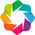

In [68]:
import holoviews as hv
hv.notebook_extension('bokeh')

In [98]:
import numpy as np

N = 1000
N = int(1e7)
data = np.random.multivariate_normal([0,0], [[1,0],[0.,1]], N)

In [ ]:
ds = hv.Dataset(df)

hv.Points(ds, kdims['ra', 'dec'], vdims=['mag'])

In [99]:
pts = hv.Points(data)

In [102]:
%%opts RGB [width=600, height=600]
from holoviews.operation.datashader import datashade, dynspread

dynspread(datashade(pts))

:DynamicMap   []

In [96]:
%%opts Points [tools=['hover']]
pts

:Points   [x,y]

In [80]:
pts.opts(plot={'width':300, 'height':300})

:Points   [x,y]

In [82]:
%%opts Points [width=600, height=600] (color='red', marker='+')
pts

:Points   [x,y]

In [87]:
def get_points(a=0, b=0):
    return hv.Points(np.random.multivariate_normal([0,0], [[1,a], [b,1]], N))

In [90]:
dmap = hv.DynamicMap(get_points, kdims=['a', 'b'])

dmap = dmap.redim.range(a=(0.,5.), b=(0,5.))

In [91]:
dmap

:DynamicMap   [a,b]

In [ ]:
from lsst.daf.persistence import Butler
butler = Butler('/project/tmorton/DM-10765')

In [ ]:
exp = butler.get('deepCoadd_calexp', tract=9813, patch='4,4', filter='HSC-I')
mask = exp.mask

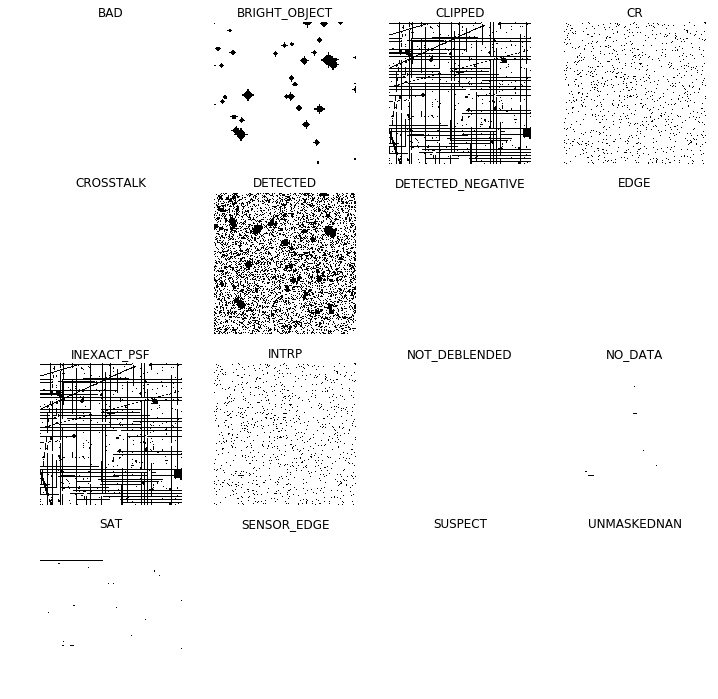

In [103]:
# the matplotlib way

%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

def plotMaskSub(arr, title, cmap=None, vmin=None, vmax=None):
    plt.imshow(arr, vmin=vmin, vmax=vmax,  origin='lower', cmap=cmap, interpolation='nearest')
    plt.title(title)

fig = plt.figure(figsize=(12,12))
for i, (name, bit) in enumerate(mask.getMaskPlaneDict().items()):
    fig.add_subplot(4, 4, i + 1)
    plotMaskSub(np.where(mask.array & 2**bit, 1, 0), name, cmap='Greys')
    plt.axis('off')

In [105]:
# holoviews/datashader way
from holoviews.operation.datashader import regrid, shade

def plotMaskSub(arr, title, cmap=None, vmin=None, vmax=None):
    return shade(regrid(hv.Image(arr).relabel(title), aggregator='max')).opts(plot=dict(xaxis=None, yaxis=None))

imlist = []
for name, bit in mask.getMaskPlaneDict().items():
    arr = np.where(mask.array & 2**bit, 1, 0)
    imlist.append(plotMaskSub(arr, name))
    
hv.Layout(imlist).cols(4)

:Layout
   .DynamicMap.I    :DynamicMap   []
   .DynamicMap.II   :DynamicMap   []
   .DynamicMap.III  :DynamicMap   []
   .DynamicMap.IV   :DynamicMap   []
   .DynamicMap.V    :DynamicMap   []
   .DynamicMap.VI   :DynamicMap   []
   .DynamicMap.VII  :DynamicMap   []
   .DynamicMap.VIII :DynamicMap   []
   .DynamicMap.IX   :DynamicMap   []
   .DynamicMap.X    :DynamicMap   []
   .DynamicMap.XI   :DynamicMap   []
   .DynamicMap.XII  :DynamicMap   []
   .DynamicMap.XIII :DynamicMap   []
   .DynamicMap.XIV  :DynamicMap   []
   .DynamicMap.XV   :DynamicMap   []
   .DynamicMap.XVI  :DynamicMap   []

In [106]:
%%opts RGB [width=800, height=800]
%%opts RGB [xaxis=None, yaxis=None]

shade(regrid(hv.Image(exp.image.array)))

:DynamicMap   []